# Notebook to Retrieve and Inspect DSVM Files 

# Step 0 - Set up Notebook

In [1]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import rasterio
import boto3
import json
import tempfile
import requests
import rasterio
from rasterio.features import shapes
from rasterio.io import MemoryFile
from rasterio.transform import from_origin
from shapely.geometry import shape
from shapely.geometry import box
from shapely.ops import unary_union
from rasterio.plot import show
from snowML.datapipe.utils import get_geos as gg
from snowML.datapipe.utils import snow_types as st
from snowML.datapipe.utils import data_utils as du
from snowML.datapipe.utils import get_dem as gd
from snowML.viz import vis_utils as vu


# Step 1 - Define Some Functions for Dealing with Raster Data 

In [2]:
def inspect(raster_path): 
    with rasterio.open(raster_path) as src:
        band_count = src.count
        print(f"The raster has {band_count} band(s).")
        data = src.read(1)  # Read the first (and likely only) band
        nodata = src.nodata
        profile = src.profile
        bounds = src.bounds
        crs = src.crs
        
        print("CRS:", crs)
        print("Bounds:", bounds)
        print("Data shape:", data.shape) 
        print("Profile:", profile)
        show(src)

    # Get unique values
    unique_values = np.unique(data)

    print("Unique values in the raster:")
    print(unique_values)


In [3]:
def load_raster(raster_path, band = 1): 
    with rasterio.open(raster_path) as src:
        band_count = src.count
        print(f"The raster has {band_count} band(s).")
        data = src.read(1)  # Read the first (and likely only) band
    
    

In [4]:
# Assume source crs is EPSG 26910 (traditional choice for Western WA) if none specified in metadata 

def convert_to_gdp(raster_path, source_crs = "EPSG:26910"): 
    
    with rasterio.open(raster_path) as src:
        data = src.read(1)
        transform = src.transform

        # Create a mask for included areas (value == 1)
        mask = data == 1

        # Extract shapes (polygons) from raster mask
        results = (
            {'geometry': shape(geom), 'value': value}
            for geom, value in shapes(data, mask=mask, transform=transform)
        )

        # Convert to GeoDataFrame
        gdf = gpd.GeoDataFrame.from_records(results)

        # Drop the 'value' column if only geometry is needed
        gdf = gdf.drop(columns='value')
        gdf = gdf.set_geometry("geometry")

        # Assign the source CRS and reproject to EPSG:4326
        gdf.set_crs(source_crs, inplace=True)
        gdf = gdf.to_crs("EPSG:4326")

    return gdf


In [5]:
def save_gdf_to_s3_geojson(gdf, f_out):
    """
    Save a GeoDataFrame as a GeoJSON file to the 'snowml-shape' S3 bucket.

    Parameters:
        gdf (GeoDataFrame): The GeoDataFrame to save.
        f_out (str): Desired S3 key (filename), e.g., 'cedar_geometry.geojson'
    """
    # Save locally to a temp file
    with tempfile.NamedTemporaryFile(suffix=".geojson") as tmpfile:
        gdf.to_file(tmpfile.name, driver="GeoJSON")

        # Upload to S3
        s3 = boto3.client("s3")
        s3.upload_file(tmpfile.name, "snowml-shape", f_out)


# Step 2  - Define Raster Paths 

In [6]:
rp_cedar =  "https://data.cig.uw.edu/picea/mauger/misc/wrf_run_agg/cedar_mask/"
rp_snoho  = "https://data.cig.uw.edu/picea/mauger/misc/wrf_run_agg/snoho_mask/"
rp_green = "https://data.cig.uw.edu/picea/mauger/misc/wrf_run_agg/green_mask/"
asc_stilly = "https://data.cig.uw.edu/picea/mauger/misc/wrf_run_agg/stilly_mask.asc"

# Step 3 - Inspect Example

The raster has 1 band(s).
CRS: None
Bounds: BoundingBox(left=556472.33842883, bottom=5231786.4732985, right=619622.33842883, top=5263136.4732985)
Data shape: (209, 421)
Profile: {'driver': 'AIG', 'dtype': 'uint8', 'nodata': 255.0, 'width': 421, 'height': 209, 'count': 1, 'crs': None, 'transform': Affine(150.0, 0.0, 556472.33842883,
       0.0, -150.0, 5263136.4732985), 'blockxsize': 256, 'blockysize': 16, 'tiled': True}


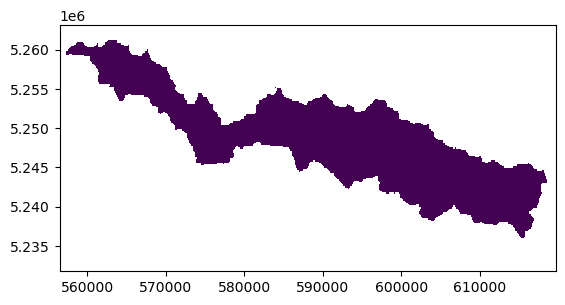

Unique values in the raster:
[  1 255]


In [7]:
inspect(rp_cedar)

In [8]:
geos_cedar = convert_to_gdp(rp_cedar)
geos_cedar

,geometry
0,"POLYGON ((-122.21627 47.50278, -122.21633 47.4..."


In [9]:
geos_cedar.explore()

# Step 4 - Create DEM and Snow Type Maps 


In [10]:
def dem_and_snowtype(geos, name, huc_lev): 
    dem_ds = gd.get_dem(geos)
    f_out = f"../../docs/basic_maps/Digital_Elevation_Model_(DEM)_for_{name}_HSVM"
    vu.plot_dem(dem_ds, geos, name, f_out = f_out) 
    ds_snow = st.get_snow_class_data(geos)
    vu.map_snow_types(ds_snow, geos, name, huc_lev = huc_lev, output_dir = "../../docs/basic_maps")
    

In [11]:
dem_and_snowtype(geos_cedar, "Cedar", "10")

Map saved to ../../docs/basic_maps/Digital_Elevation_Model_(DEM)_for_Cedar_HSVM
Map saved to ../../docs/basic_maps/Snow_classes_for_huc10in_Cedar.png


# Step 5 - Get SubBasins

In [12]:
# define a function that calculates percent overlap between the geometries in two gdfs 
def percent_overlap(geom1, geom2, geom1_name, geom2_name):
  
    # Reproject
    geom1 = geom1.to_crs("EPSG:26910")
    geom2 = geom2.to_crs("EPSG:26910")
    
    # Calculate intersection area
    intersection = geom1.intersection(geom2)
    intersection_area = intersection.area
    
    # Calculate percentages
    percent_1_in_2 = (intersection_area / geom1.area) * 100
    percent_2_in_1 = (intersection_area / geom2.area) * 100

    print(f"percent_{geom1_name}_in_{geom2_name} is {round(percent_1_in_2.iloc[0])}")
    print(f"percent_{geom2_name}_in_{geom1_name} is {round(percent_2_in_1.iloc[0])}")
    
  


In [13]:
def visual_inspect(gdf1, gdf2, gdf1_name, gdf2_name): 
   # Start the map with the first GeoDataFrame
    m = gdf1.explore(color="blue", style_kwds={'fillOpacity': 0.3}, name=gdf1_name)

    # Add the second GeoDataFrame to the same map
    gdf2.explore(m=m, color="red", style_kwds={'fillOpacity': 0.3}, name=gdf2_name)

    return m


In [14]:
# look at huc 10s in lake Washington basin
geos_lake_wash = gg.get_geos_with_name(17110012, '10')
#geos_lake_wash.explore()

In [15]:
# guess huc 
huc10_cedar = "1711001201"
geos_cedar_10 = gg.get_geos_with_name(huc10_cedar, '10')
geos_cedar_12 = gg.get_geos_with_name(huc10_cedar, '12')

In [16]:
# visual inspect
visual_inspect(geos_cedar, geos_cedar_12, "hsvm_shape", "huc_12_boundaries")

In [17]:
# caclulate overlap 
percent_overlap(geos_cedar.geometry, geos_cedar_10.geometry, "hsvm_shape", "huc_boundaries")

percent_hsvm_shape_in_huc_boundaries is 97
percent_huc_boundaries_in_hsvm_shape is 90


From visual inspection, rough correspondence btw hsvm and huc boundaries except hsvm seems to exclude rock creek, 1711000120106
How do things look if we filter that out 

In [18]:
hucs_in_cedar = geos_cedar_12[geos_cedar_12["huc_id"] != "171100120106"]
#hucs_in_cedar
combined_geometry = hucs_in_cedar.geometry.union_all()
# Wrap it in a GeoDataFrame so it supports to_crs()
combined_gdf = gpd.GeoDataFrame(geometry=[combined_geometry], crs=hucs_in_cedar.crs)

In [19]:
# visual inspect
visual_inspect(geos_cedar, hucs_in_cedar, "hsvm_shape", "huc_12_boundaries")

In [20]:
# caclulate overlap 
percent_overlap(geos_cedar.geometry, combined_gdf.geometry, "hsvm_shape", "huc_boundaries")

percent_hsvm_shape_in_huc_boundaries is 95
percent_huc_boundaries_in_hsvm_shape is 96


In [21]:
# Save cedar files
save_gdf_to_s3_geojson(geos_cedar, "hsvm_cedar.geojson")
save_gdf_to_s3_geojson(hucs_in_cedar, "hucs_match_hsvm_cedar.geojson")

# Step 5 - Get Snow Type Info 

In [22]:
df_snow_types, snow_class_counts, df_predom = st.process_all(huc10_cedar, '12')

In [23]:
df_snow_types

,huc_id,Tundra,Boreal Forest,Maritime,Ephemeral,Prairie,Montane Forest,Ice,Ocean
0,171100120101,0.0,0.0,75.0,25.0,0.0,0.0,0.0,0.0
1,171100120102,0.0,0.0,50.0,50.0,0.0,0.0,0.0,0.0
2,171100120103,0.0,0.0,50.0,50.0,0.0,0.0,0.0,0.0
3,171100120104,0.0,0.0,33.0,67.0,0.0,0.0,0.0,0.0
4,171100120105,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0
5,171100120106,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0
6,171100120107,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0
7,Average,0.0,0.0,29.7,70.3,0.0,0.0,0.0,0.0


# Step Last - Repeat for Additional Raster Paths (Green)

In [24]:
#inspect(rp_green)

In [25]:
geos_green  = convert_to_gdp(rp_green)

In [26]:
# save snowtype and dem maps 
dem_and_snowtype(geos_green, "Green", "08")

Map saved to ../../docs/basic_maps/Digital_Elevation_Model_(DEM)_for_Green_HSVM
Map saved to ../../docs/basic_maps/Snow_classes_for_huc08in_Green.png


In [27]:
geos_green.explore()

In [28]:
# guess huc 
huc8_green = "17110013"
geos_green_08 = gg.get_geos_with_name(huc8_green, '08')
geos_green_10 = gg.get_geos_with_name(huc8_green, '10')
geos_green_12 = gg.get_geos_with_name(huc8_green, '12')


In [29]:
# visual inspect
visual_inspect(geos_green, geos_green_12, "hsvm_shape", "huc_12_boundaries")

In [30]:
# caclulate overlap 
percent_overlap(geos_green.geometry, geos_green_08.geometry, "hsvm_shape", "huc_boundaries")

percent_hsvm_shape_in_huc_boundaries is 96
percent_huc_boundaries_in_hsvm_shape is 95


In [31]:
# Save green files
save_gdf_to_s3_geojson(geos_green, "hsvm_green.geojson")
save_gdf_to_s3_geojson(geos_green_12, "hucs_match_hsvm_green.geojson")

In [32]:
df_snow_types, snow_class_counts, df_predom = st.process_all(huc8_green, '12')

In [33]:
df_snow_types

,huc_id,Tundra,Boreal Forest,Maritime,Ephemeral,Prairie,Montane Forest,Ice,Ocean
0,171100130101,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0
1,171100130102,0.0,0.0,67.0,33.0,0.0,0.0,0.0,0.0
2,171100130103,0.0,0.0,80.0,20.0,0.0,0.0,0.0,0.0
3,171100130104,0.0,0.0,83.0,17.0,0.0,0.0,0.0,0.0
4,171100130105,0.0,0.0,75.0,25.0,0.0,0.0,0.0,0.0
5,171100130106,0.0,0.0,33.0,67.0,0.0,0.0,0.0,0.0
6,171100130201,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0
7,171100130202,0.0,0.0,33.0,67.0,0.0,0.0,0.0,0.0
8,171100130203,0.0,0.0,40.0,60.0,0.0,0.0,0.0,0.0
9,171100130204,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0


# Step Last - Repeat for Additional Raster Paths (Snohomish)

In [34]:
#inspect(rp_snoho)

In [35]:
geos_snoho = convert_to_gdp(rp_snoho)
geos_snoho

,geometry
0,"POLYGON ((-121.43982 47.37285, -121.43986 47.3..."
1,"POLYGON ((-122.08613 48.14102, -122.08618 48.1..."


In [36]:
geos_snoho.explore()

In [37]:
geos_snoho.iloc[[0]].explore()

In [38]:
geos_snoho.iloc[[1]].explore()

Why were two shapes returned for geos_snoho?  I will use geos_snoho.iloc[[1]], not sure what the small box is? 

In [39]:
# Snohomish for HSVM is huge, appears to include 17110011, 17110012, and 1711009
geos_lake_samm_12 = gg.get_geos_with_name(17110011, '12')
geos_sky_12 = gg.get_geos_with_name(17110009, '12')
geos_snoq_12 = gg.get_geos_with_name(17110010, '12')
combined_geos_12 = pd.concat([geos_snoq_12, geos_sky_12, geos_lake_samm_12], ignore_index=True)


In [40]:
visual_inspect(geos_snoho.iloc[[1]], combined_geos_12, "dhsvm_shape", "huc_12_boundaries")

In [41]:
# caclulate overlap 
combined_geometry = combined_geos_12.geometry.union_all()
# Wrap it in a GeoDataFrame so it supports to_crs()
combined_gdf = gpd.GeoDataFrame(geometry=[combined_geometry], crs=combined_geos_12.crs)
combined_gdf 


,geometry
0,"POLYGON ((-121.80655 47.4409, -121.80737 47.44..."


In [42]:
geos_snoho_2 = geos_snoho.iloc[[1]].reset_index(drop=True)
geos_snoho_2


,geometry
0,"POLYGON ((-122.08613 48.14102, -122.08618 48.1..."


In [43]:
dem_and_snowtype(geos_snoho_2, "Snoho", "10")

Map saved to ../../docs/basic_maps/Digital_Elevation_Model_(DEM)_for_Snoho_HSVM
Map saved to ../../docs/basic_maps/Snow_classes_for_huc10in_Snoho.png


In [44]:
percent_overlap(geos_snoho_2.geometry, combined_gdf.geometry, "hsvm_shape", "huc_boundaries")

percent_hsvm_shape_in_huc_boundaries is 99
percent_huc_boundaries_in_hsvm_shape is 97


In [64]:
# save snoho shape files
save_gdf_to_s3_geojson(geos_snoho_2, "hsvm_snoho.geojson")
save_gdf_to_s3_geojson(combined_geos_12, "hucs_match_hsvm_snoho.geojson")

In [46]:
# calculate snow types 
for huc in [17110009, 17110011, 17110012]:
    df_snow_types, snow_class_counts, df_predom = st.process_all(huc, '12')
    print(df_snow_types[["huc_id", "Maritime", "Ephemeral"]]) 

          huc_id  Maritime  Ephemeral
0   171100090101     100.0        0.0
1   171100090102     100.0        0.0
2   171100090103      91.0        9.0
3   171100090104     100.0        0.0
4   171100090201     100.0        0.0
5   171100090202      75.0       25.0
6   171100090203      50.0       50.0
7   171100090301      86.0       14.0
8   171100090302      71.0       29.0
9   171100090303      50.0       50.0
10  171100090401     100.0        0.0
11  171100090402      75.0       25.0
12  171100090403      60.0       40.0
13  171100090501      80.0       20.0
14  171100090502      71.0       29.0
15  171100090503       0.0      100.0
16  171100090601      25.0       75.0
17  171100090602      38.0       62.0
18  171100090603      33.0       67.0
19  171100090701       0.0      100.0
20  171100090702      14.0       86.0
21       Average      62.8       37.2
         huc_id  Maritime  Ephemeral
0  171100110101      12.0       88.0
1  171100110102       0.0      100.0
2  171100110103

In [47]:
# use Skagit shapefile from local save
gdf_Skagit = gpd.read_file("SkagitBoundary.json")
gdf_Skagit

,OBJECTID,AREA,PERIMETER,SKAGIT_,SKAGIT_ID,GRID_CODE,Shape_Leng,Shape_Area,geometry
0,1,8.060220e+09,948300.0,2,1,1,948300.0,8.060220e+09,"POLYGON ((-120.81726 49.26101, -120.8152 49.26..."


# Step Last - Repeat for Skagit 

In [48]:
gdf_Skagit.explore()

In [49]:
geos_Skagit = gg.get_geos_with_name(17110005, '12')
geos_Skagit.shape

(57, 4)

In [50]:
gg.get_geos_with_name(171100, '08')

,name,huc_id,huc_name,geometry
0,Sumas River,17110001,Sumas River,"POLYGON ((-121.51825 49.20725, -121.51877 49.2..."
1,Strait of Georgia,17110002,Strait of Georgia,"POLYGON ((-122.78652 49.2053, -122.78755 49.20..."
2,San Juan Islands,17110003,San Juan Islands,"POLYGON ((-123.37703 48.96767, -123.46728 48.9..."
3,Nooksack,17110004,Nooksack,"POLYGON ((-122.48307 49.0761, -122.48353 49.07..."
4,Upper Skagit,17110005,Upper Skagit,"POLYGON ((-120.9984 49.31151, -120.99851 49.31..."
5,Sauk,17110006,Sauk,"POLYGON ((-121.607 48.48139, -121.60755 48.481..."
6,Lower Skagit,17110007,Lower Skagit,"MULTIPOLYGON (((-122.47091 48.35237, -122.4707..."
7,Stillaguamish,17110008,Stillaguamish,"POLYGON ((-121.90299 48.45165, -121.90302 48.4..."
8,Skykomish,17110009,Skykomish,"POLYGON ((-121.54078 48.05915, -121.54076 48.0..."
9,Snoqualmie,17110010,Snoqualmie,"POLYGON ((-121.96849 47.81844, -121.9692 47.81..."


In [51]:
geos_Skagit.explore()

In [52]:
visual_inspect(gdf_Skagit, geos_Skagit, "dhsvm_shape", "huc_12_boundaries")

# Step Last - Repeat for Stilly 

In [53]:
# define a new function since Stilly file is ASC 


def extract_outline_from_asc(url):
    with tempfile.TemporaryDirectory() as tmpdir:
        local_path = os.path.join(tmpdir, "raster.asc")
        
        # Download file
        with requests.get(url, stream=True) as r:
            r.raise_for_status()
            with open(local_path, 'wb') as f:
                for chunk in r.iter_content(chunk_size=8192):
                    f.write(chunk)

        # Open the raster and manually inject CRS
        with rasterio.open(local_path) as src:
            image = src.read(1)
            transform = src.transform
            nodata = src.nodata
            meta = src.meta.copy()
            meta["crs"] = "EPSG:26910"

        # Reopen with correct CRS
        with MemoryFile() as memfile:
            with memfile.open(**meta) as dataset:
                dataset.write(image, 1)
                mask = (image != nodata) & (image > 0)
                extracted_shapes = shapes(image.astype(np.int16), mask=mask, transform=transform)
                polygons = [shape(geom) for geom, val in extracted_shapes if val > 0]
                merged = unary_union(polygons)
    
    gdf = gpd.GeoDataFrame(geometry=[merged], crs="EPSG:26910")
    return gdf.to_crs("EPSG:4326")




In [54]:
gdf_stilly = extract_outline_from_asc(asc_stilly)
gdf_stilly

,geometry
0,"POLYGON ((-123.73256 1.46741, -123.73255 1.464..."


In [55]:
gdf_stilly.explore()

In [2]:
# Still shapefile from Nicloeta (local save)
f = "../../docs/stilly.geojson"
gdf_Skilly_local_save = gpd.read_file(f)



In [3]:
gdf_Skilly_local_save.explore()

In [56]:
geos_stilly = gg.get_geos_with_name(17110008, '12')


In [57]:
geos_stilly_filtered = geos_stilly[geos_stilly["huc_id"] != '171100080304']

In [58]:
geos_stilly.explore()

In [59]:
geos_stilly_filtered.explore()

In [60]:
# Have to use reconstructed hucs for dem and snowtype 
dem_and_snowtype(geos_stilly_filtered, "stilly", '10')

Map saved to ../../docs/basic_maps/Digital_Elevation_Model_(DEM)_for_stilly_HSVM
Map saved to ../../docs/basic_maps/Snow_classes_for_huc10in_stilly.png


In [65]:
# Save resconstructed Stilly Shape File 
save_gdf_to_s3_geojson(geos_stilly_filtered, "hucs_match_hsvm_stilly.geojson")

In [62]:
# calculate snow types 
huc = 17110008
df_snow_types, snow_class_counts, df_predom = st.process_all(huc, '12')
print(df_snow_types[["huc_id", "Maritime", "Ephemeral"]]) 

          huc_id  Maritime  Ephemeral
0   171100080101      60.0       40.0
1   171100080102      40.0       60.0
2   171100080103      50.0       50.0
3   171100080104      83.0       17.0
4   171100080105      67.0       33.0
5   171100080106       0.0      100.0
6   171100080107      75.0       25.0
7   171100080108      71.0       29.0
8   171100080109       0.0      100.0
9   171100080201      80.0       20.0
10  171100080202      62.0       38.0
11  171100080203      36.0       64.0
12  171100080204     100.0        0.0
13  171100080205       0.0      100.0
14  171100080206      12.0       88.0
15  171100080207       0.0      100.0
16  171100080301      22.0       78.0
17  171100080302       0.0      100.0
18  171100080303       0.0      100.0
19  171100080304       0.0      100.0
20       Average      37.9       62.1


Comment: 13 Maritime, 7 Ephemeral (6 Ephemeral if 171100080304 excluded)